# Exploratory analysis of seasonal timeseries

Little practice notebook for some basic timeseries analysis techniques. Much of this is cribbed from [here](https://a-little-book-of-r-for-time-series.readthedocs.org/en/latest/src/timeseries.html)

In [137]:
source('../NMEG_utils/r_functions/load_nmeg.r')
library(ggplot2)

mpj <- daily_to_xts(get_daily_file('Mpj', 'aflx', make_new=FALSE))
mpj_s <- daily_to_xts(get_daily_file('Mpj', 'soilmet', make_new=FALSE))

names(mpj)

[1] "GPP_g_int"      "RECO_g_int"     "FC_F_g_int"     "ET_mm_24hint_0"
 [5] "P_F_sum"        "TA_F_avg"       "RH_F_avg"       "SW_IN_F_avg"   
 [9] "RNET_F_avg"     "VPD_F_avg"      "TA_F_min"       "VPD_F_min"     
[13] "TA_F_max"       "VPD_F_max"      "ET_mm_dayint"   "PET_mm_dayint"

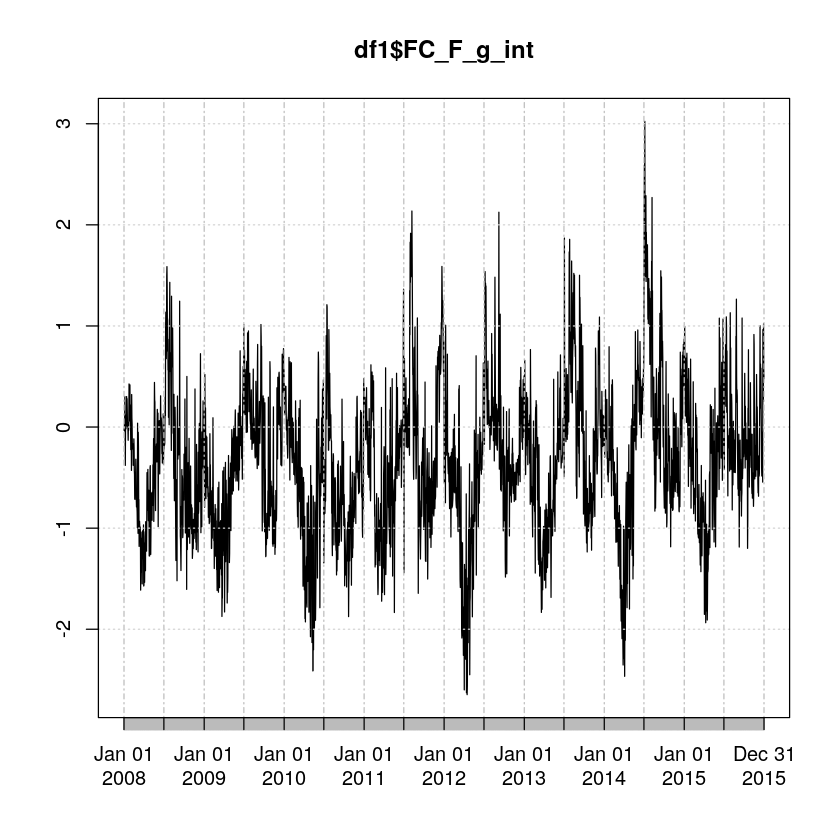

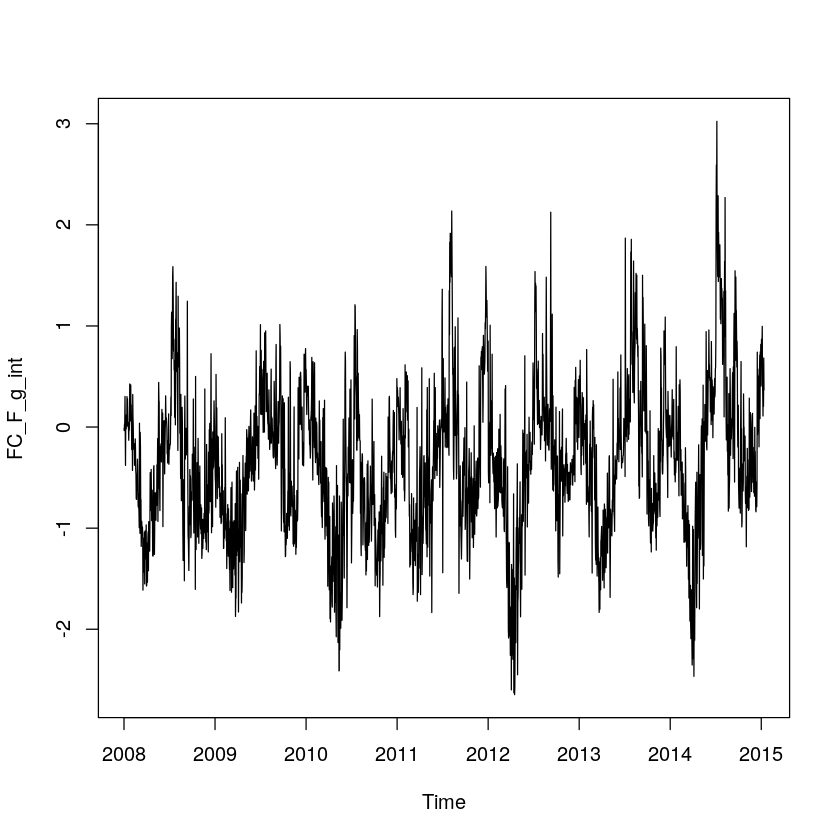

In [138]:
df1 <- mpj
# Different time series objects have different plotting methods (but "plot(...)" should work for any):
# 1. Plot the xts
plot.xts(df1$FC_F_g_int)
# 2. Convert to a ts object and plot
df1_ts <- ts(df1$FC_F_g_int, frequency = 365, start = c(2008, 1, 1),end = c(2015, 12, 31))
plot.ts(df1_ts)
# or in ggplot2
#ggplot(df1, aes(x=Index, y=FC_F_g_int)) + geom_line()

## Decomposition methods

### Simple moving average to detect a trend

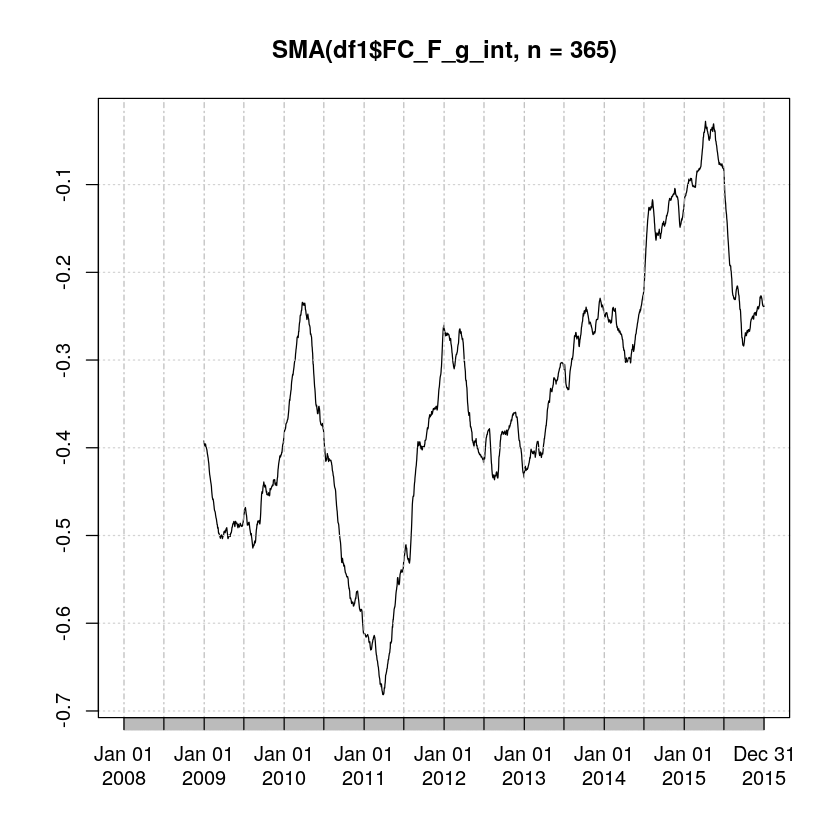

In [139]:
# Plot 1 year moving average with SMA
library("TTR")
plot(SMA(df1$FC_F_g_int,n=365))

### Full additive decomposition - seasonal, trend, random components

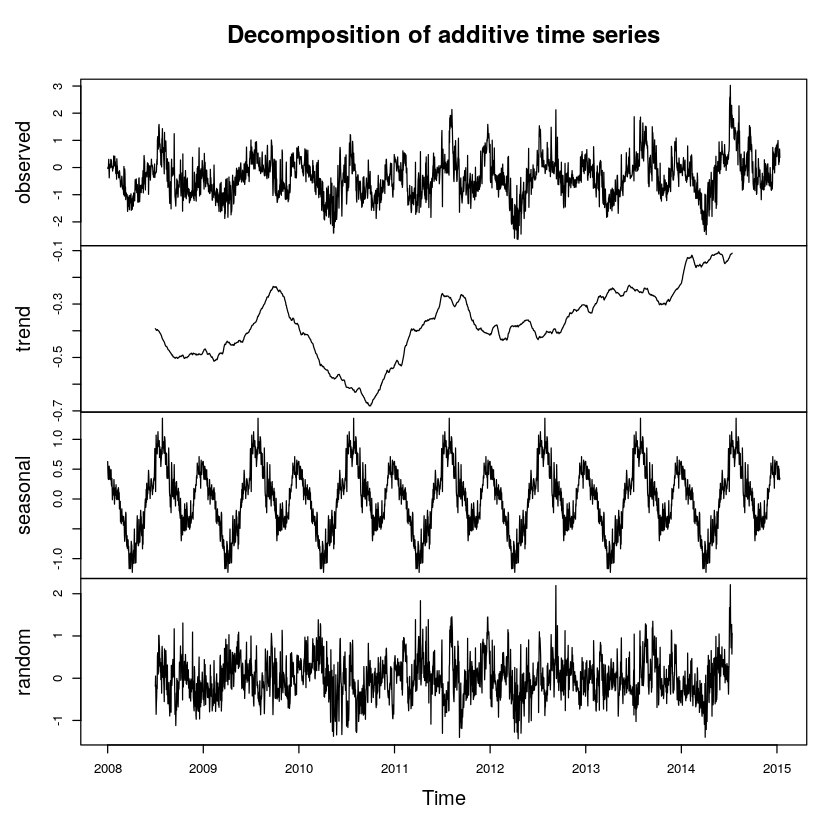

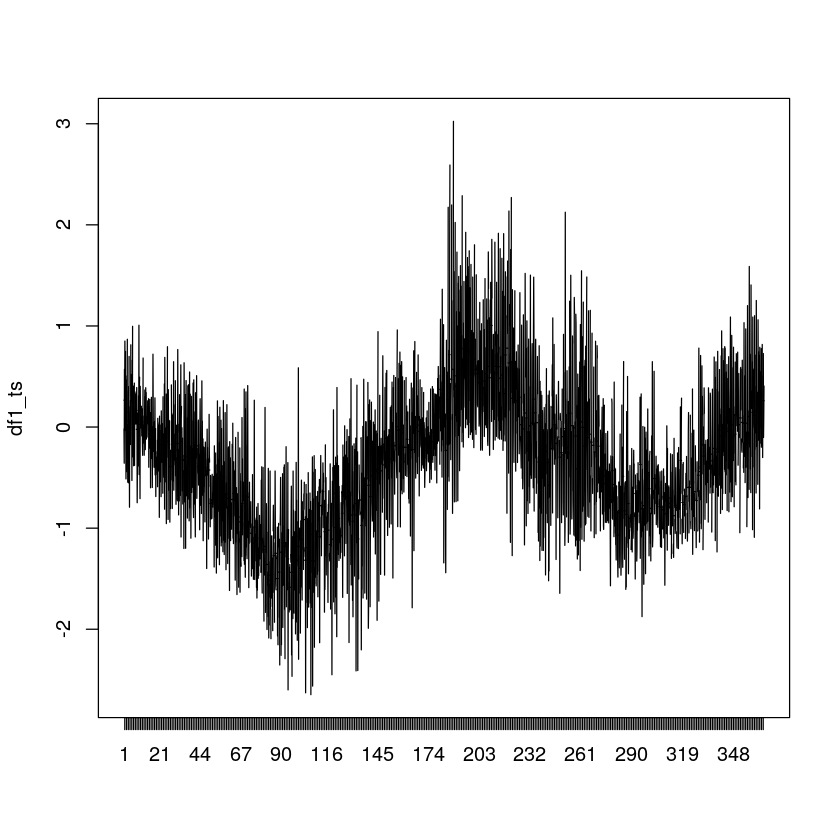

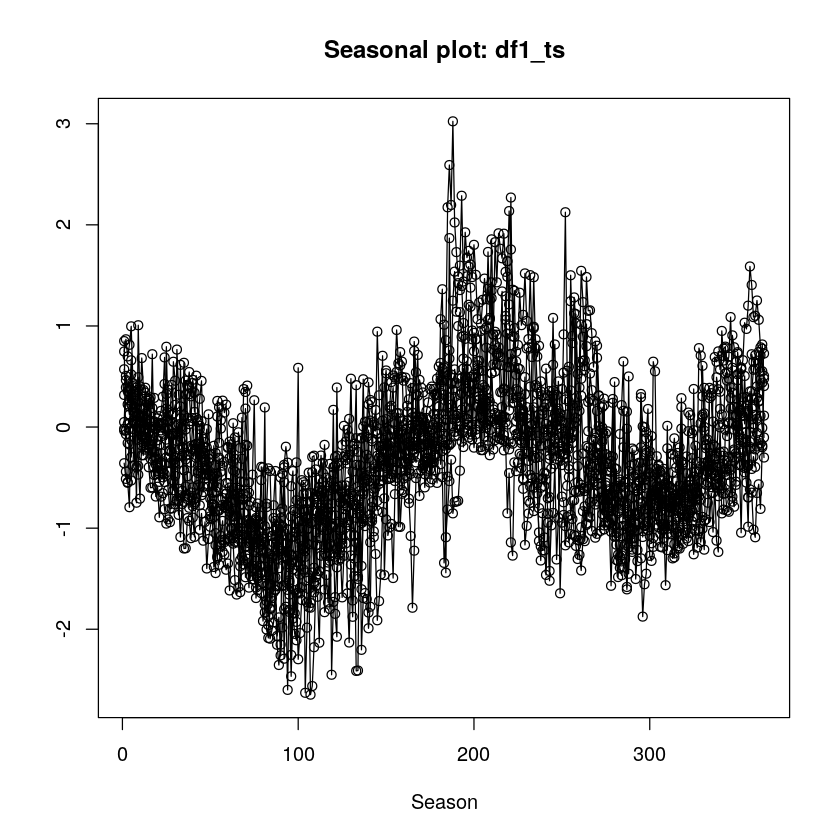

In [140]:
# Decomposition methods for seasonality

# decompose only seems to work for ts objects
df1_decomp <- decompose(df1_ts)
plot(df1_decomp)
# Make some seasonal plots
monthplot(df1_ts)
# one from forecast
library(forecast)
seasonplot(df1_ts) 

ERROR: Error in stl(df1_ts, s.window = "period", na.action = na.omit): only univariate series are allowed


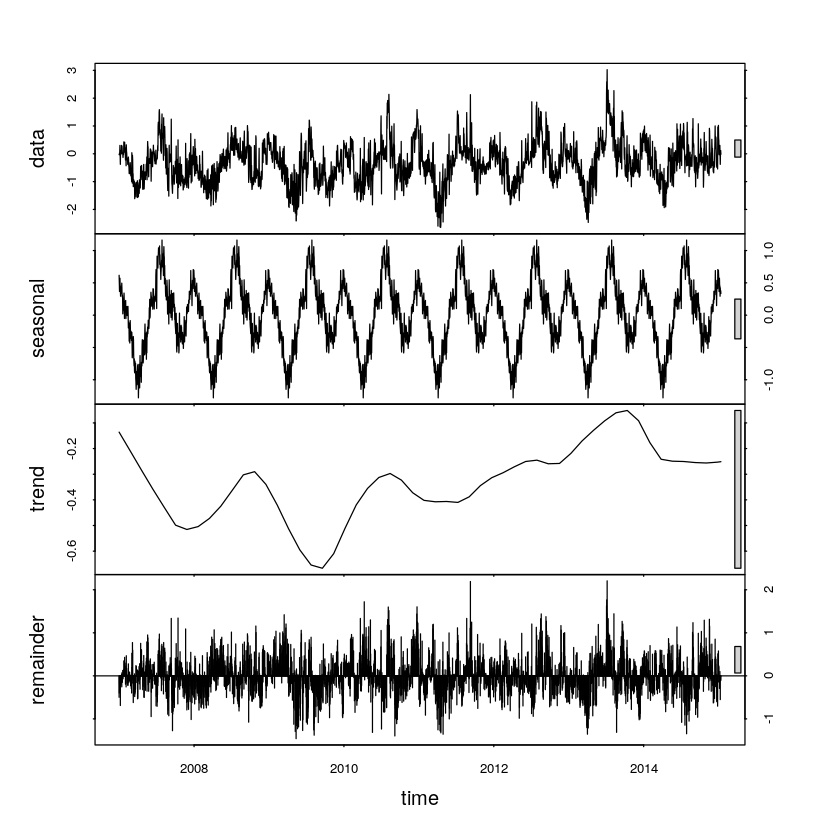

In [141]:
# Seasonal decomposition using loess
df1_decomp2 <- stl(df1_ts, s.window="period", na.action=na.omit)
plot(df1_decomp2)

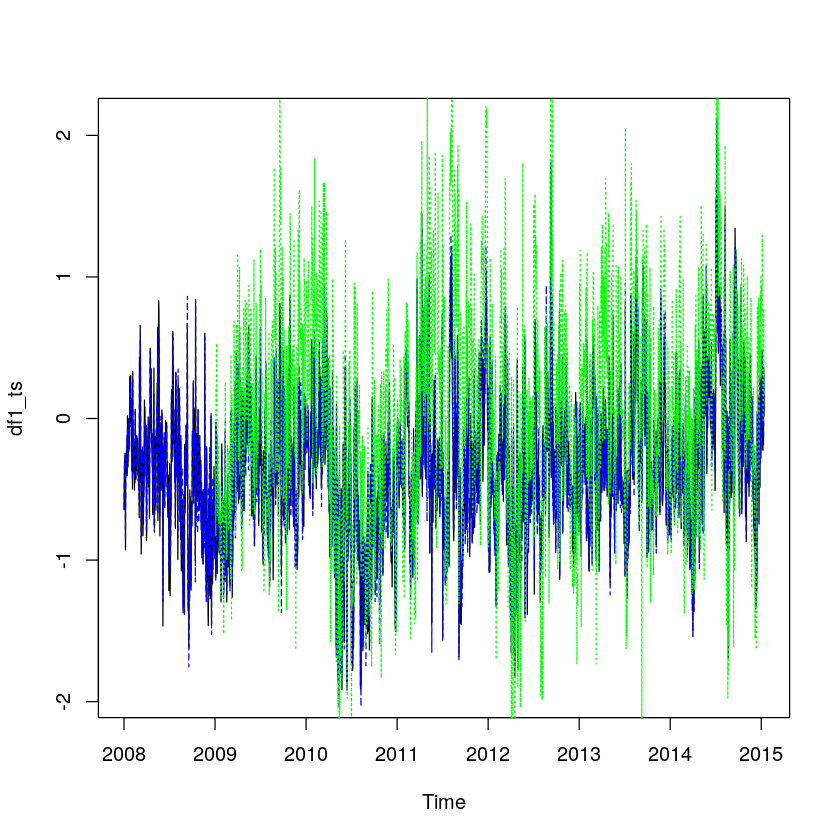

In [142]:
# Plot the seasonal residual (data - seasonal pattern)
df1_deseason <- df1_ts - df1_decomp$seasonal
df1_deseason2 <- df1_ts - df1_decomp2$time.series[,'seasonal']
# an alternative way to adjust for seasonal differences
df1_deseason3 <- diff(df1_ts, 365)

plot(df1_deseason)
lines(df1_deseason2, col='blue', lty='dashed')
lines(df1_deseason3, col='green', lty='dotted')

## Autocorrelation and stationarity of time series

A stationary time series is one whose statistical properties such as mean, variance, autocorrelation, etc. are all constant over time. Most statistical forecasting methods are based on the assumption that the time series can be rendered approximately stationary (i.e., "stationarized") through the use of mathematical transformations.

We have already removed the seasonal component in df1_deseason timeseries. Remaining non-stationarity might be overcome by subtacting trend or with differencing.

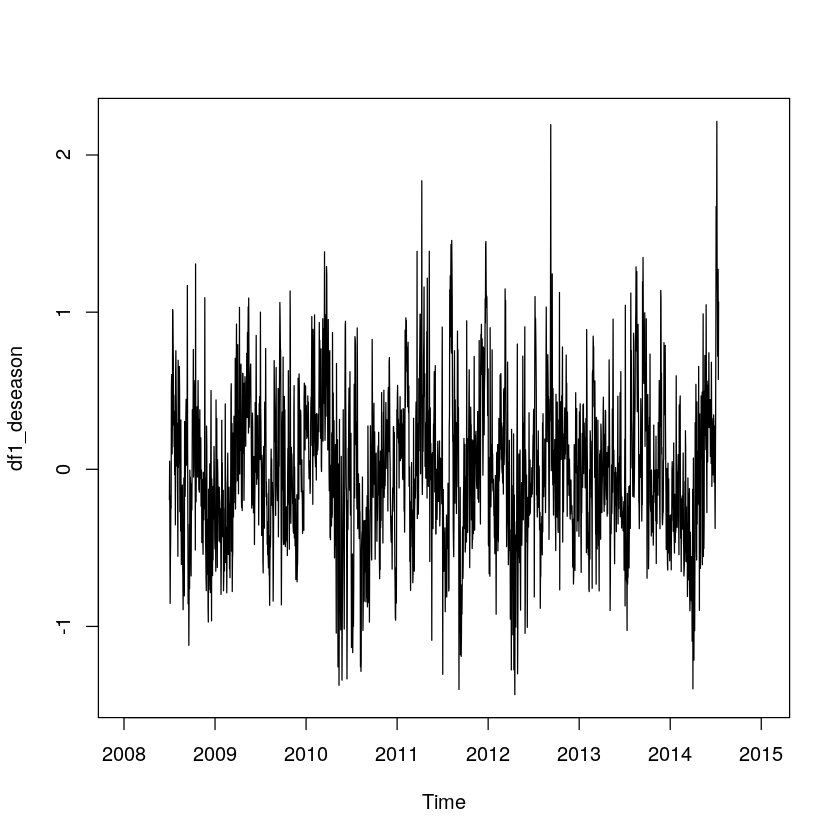


	Box-Ljung test

data:  df1_deseasdetrend
X-squared = 7399.3, df = 365, p-value < 2.2e-16


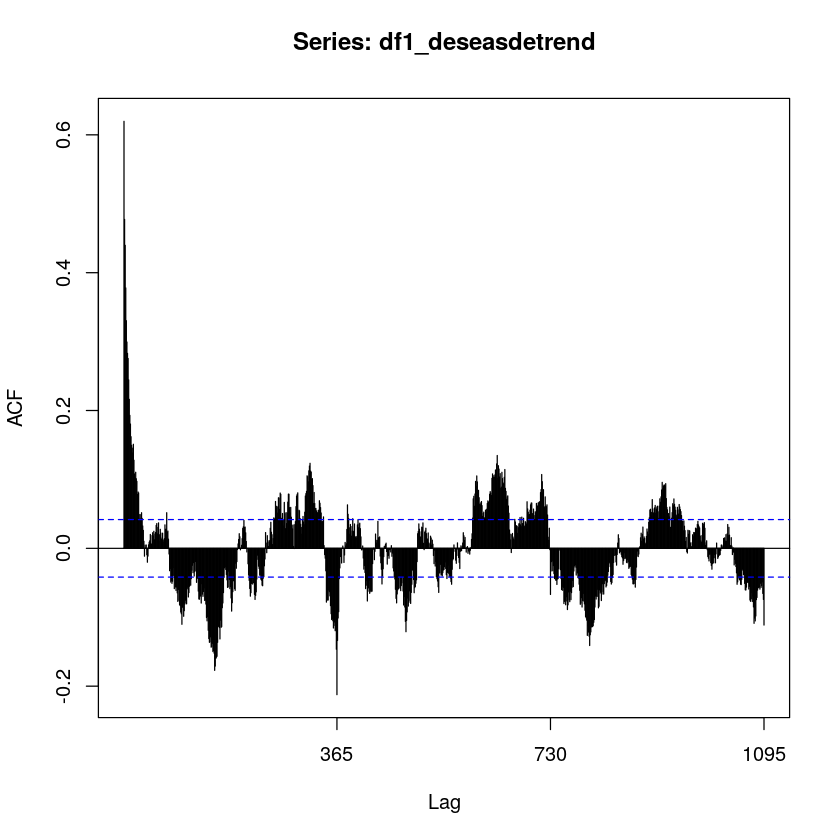

In [143]:
# First remove the trend from the data, then check remaining correlation
df1_deseasdetrend <- df1_deseason - df1_decomp$trend
plot(df1_deseasdetrend)

Acf(df1_deseasdetrend,lag.max=3*365)
# Acf functions indicates significant autocorrelation still
# Note forecast's "Acf()" and "Pacf()" omit the zero-lag correlation, "acf" and "pacf" do not

# Also conduct Box-Ljeung test
Box.test(df1_deseasdetrend, lag=365, type="Ljung-Box")
# Low p value undicates lots of evidence for remaining autocorrelation, 
# so this seasonal + trend model can be improved

In [144]:
# Tests for stationarity - these seem a little hard to apply and they test
# different aspects of stationarity

# 1) Augemented Dickey-Fuller Test
# A significant p-value means that no unit root is present (no need for differencing)
# Rejecting the null hypothesis suggests that a time series as stationary (from the tseries package)
library(tseries)
adf.test(df1_ts)

# 2) KPSS test
# significant p-value means no level trend is present (trend stationarity)
kpss.test(df1_ts)

# Estimate number of diffs needed to make stationary
ndiffs(df1_ts)
nsdiffs(df1_ts)

Warning message:
In adf.test(df1_ts): p-value smaller than printed p-value


	Augmented Dickey-Fuller Test

data:  df1_ts
Dickey-Fuller = -5.7983, Lag order = 13, p-value = 0.01
alternative hypothesis: stationary


Warning message:
In kpss.test(df1_ts): p-value smaller than printed p-value


	KPSS Test for Level Stationarity

data:  df1_ts
KPSS Level = 0.8428, Truncation lag parameter = 11, p-value = 0.01


[1] 1

[1] 0

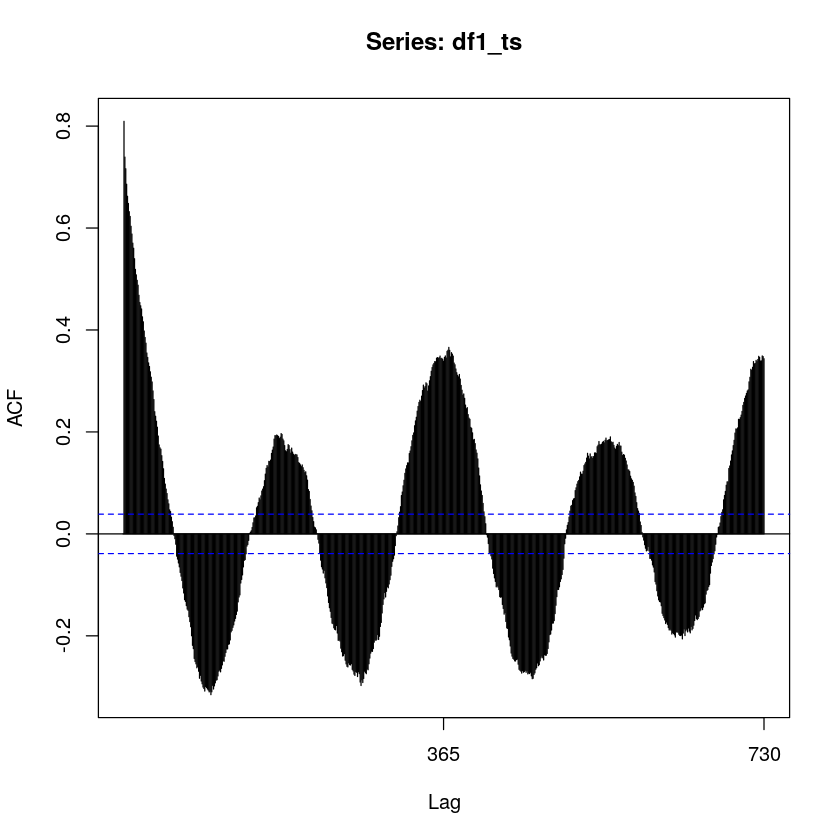

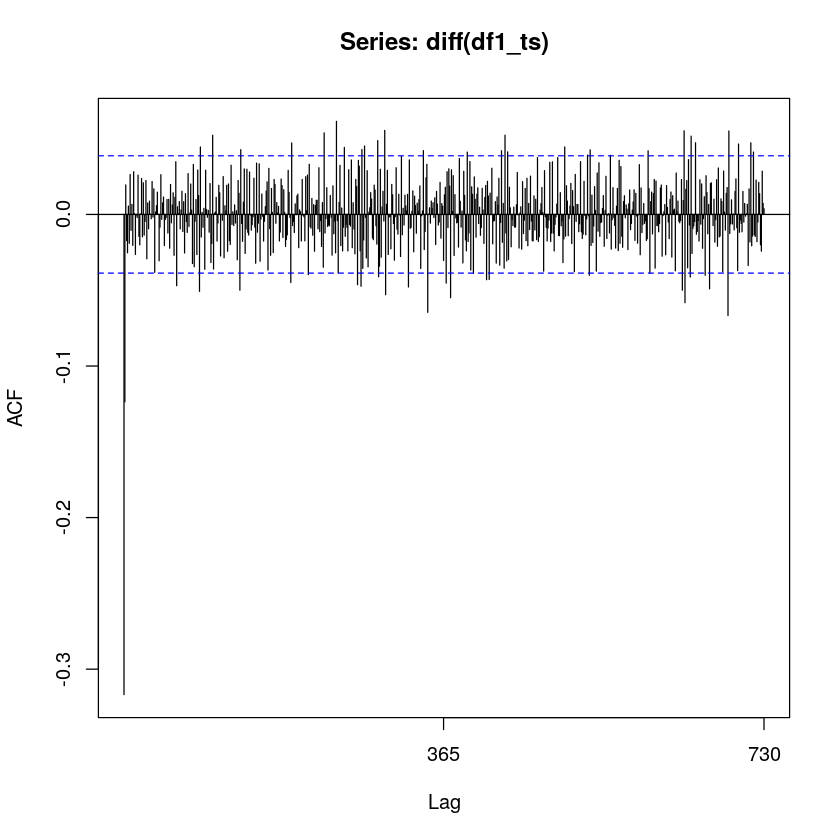

In [145]:
# See what differencing does to the autocorrelation structure
Acf(df1_ts, lag.max=2*365)
Acf(diff(df1_ts), lag.max=2*365)
#Pacf(df1_ts, lag.max=2*365)
#Pacf(diff(df1_ts), lag.max=2*365)
#Acf(df1_ts,lag.max=2*365,plot=FALSE) # this prints out the autocorrelation values

## Forecasting models

In [146]:
# Function for plotting forecast errors
plotForecastErrors <- function(forecasterrors)
  {
     # make a histogram of the forecast errors:
     mybinsize <- IQR(forecasterrors)/4
     mysd   <- sd(forecasterrors)
     mymin  <- min(forecasterrors) - mysd*5
     mymax  <- max(forecasterrors) + mysd*3
     # generate normally distributed data with mean 0 and standard deviation mysd
     mynorm <- rnorm(10000, mean=0, sd=mysd)
     mymin2 <- min(mynorm)
     mymax2 <- max(mynorm)
     if (mymin2 < mymin) { mymin <- mymin2 }
     if (mymax2 > mymax) { mymax <- mymax2 }
     # make a red histogram of the forecast errors, with the normally distributed data overlaid:
     mybins <- seq(mymin, mymax, mybinsize)
     hist(forecasterrors, col="red", freq=FALSE, breaks=mybins)
     # freq=FALSE ensures the area under the histogram = 1
     # generate normally distributed data with mean 0 and standard deviation mysd
     myhist <- hist(mynorm, plot=FALSE, breaks=mybins)
     # plot the normal curve as a blue line on top of the histogram of forecast errors:
     points(myhist$mids, myhist$density, type="l", col="blue", lwd=2)
  }

### Holt-Winters exponential smoothing

             Length Class  Mode     
fitted       8808   mts    numeric  
x            2567   ts     numeric  
alpha           1   -none- numeric  
beta            1   -none- numeric  
gamma           1   -none- numeric  
coefficients  367   -none- numeric  
seasonal        1   -none- character
SSE             1   -none- numeric  
call            2   -none- call     

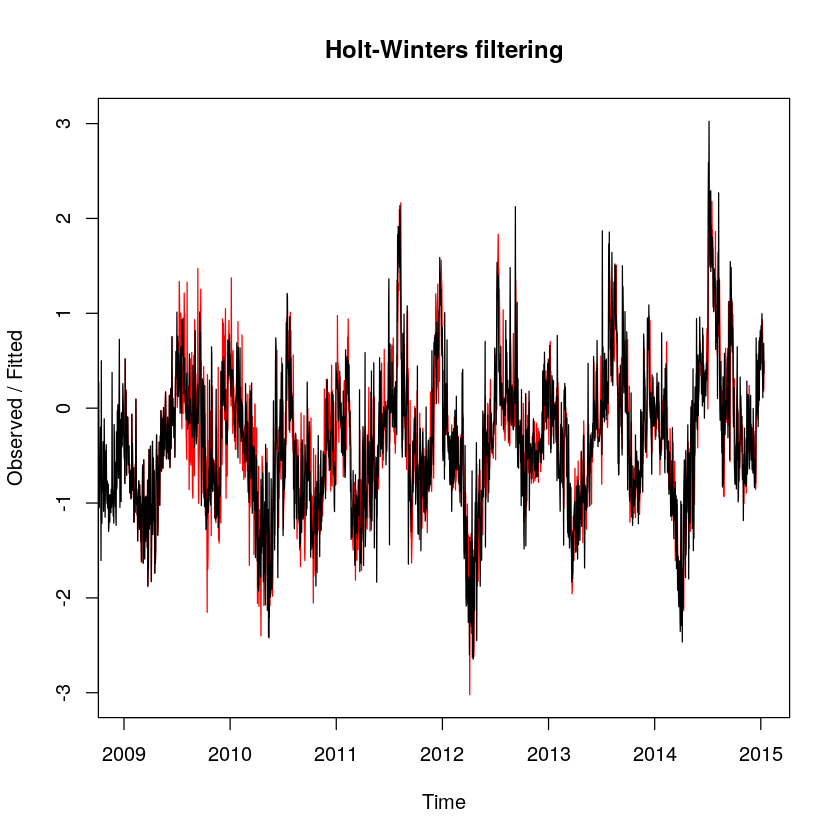

In [147]:
# First a sample forecast
df1_HWforecast <- HoltWinters(df1_ts)
summary(df1_HWforecast)
plot(df1_HWforecast)

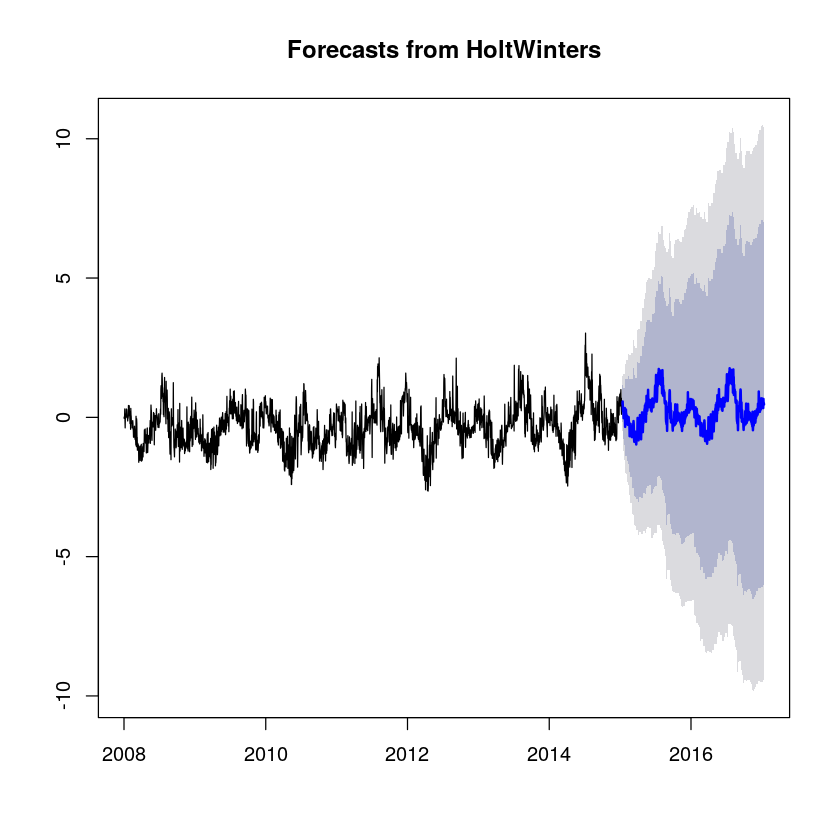

In [148]:
# Now a 2 year future forecast forecast
df1_2yr_HWforecast <- forecast.HoltWinters(df1_HWforecast, h=2*365)
#head(df1_2yr_HWforecast)
plot(df1_2yr_HWforecast)


	Box-Ljung test

data:  df1_2yr_HWforecast$residuals
X-squared = 604.37, df = 365, p-value = 4.319e-14


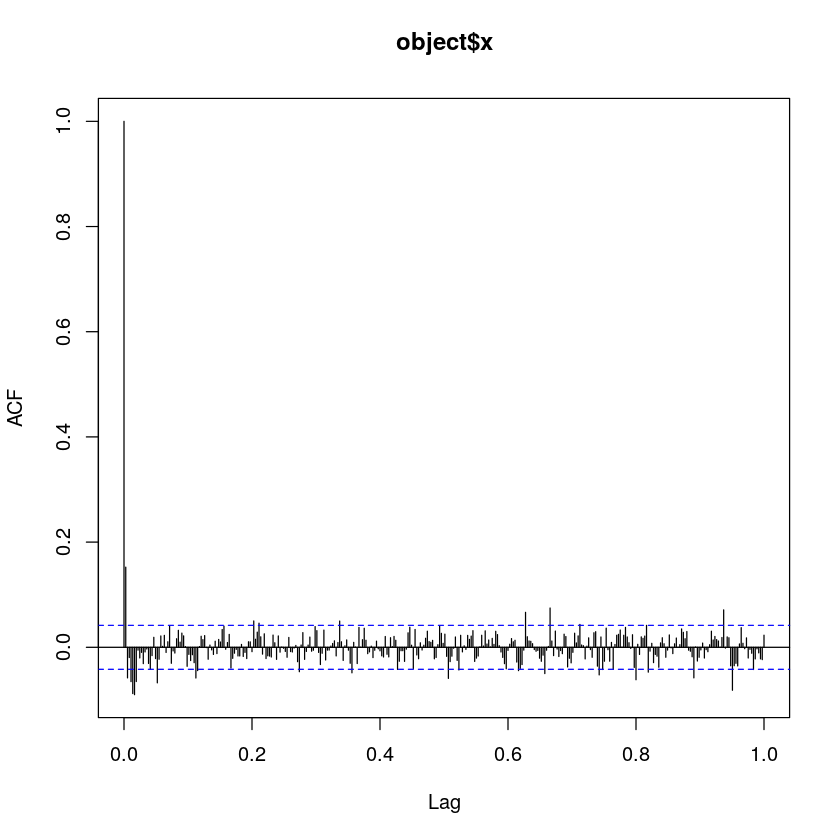

In [149]:
acf(df1_2yr_HWforecast$residuals, lag.max=365)
Box.test(df1_2yr_HWforecast$residuals, lag=365, type="Ljung-Box")
# this looks good, but low p value indicates this is still pretty correlated

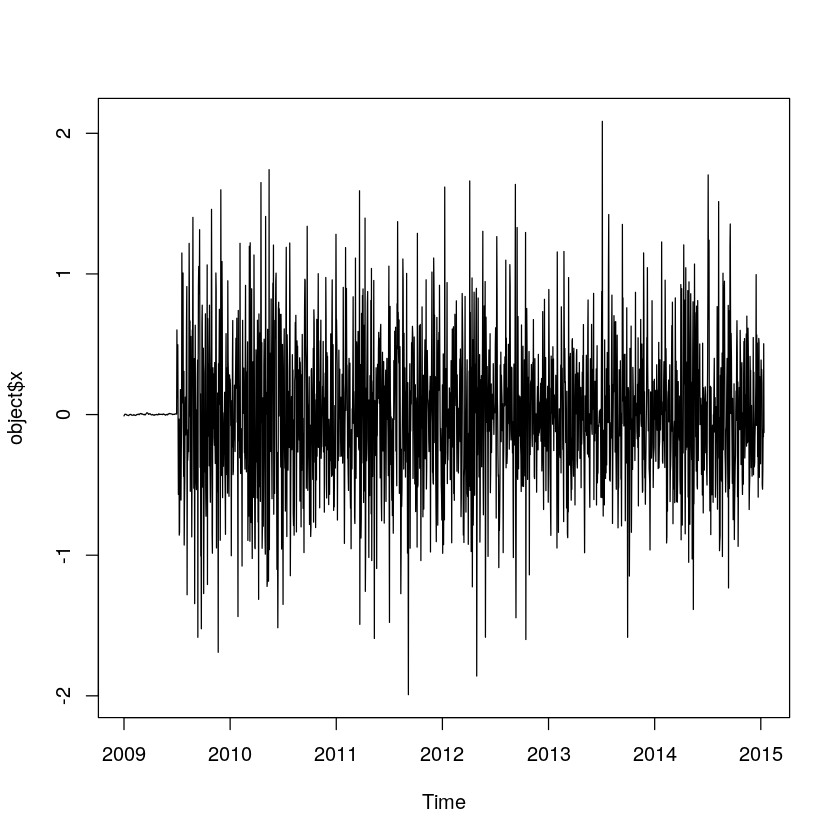

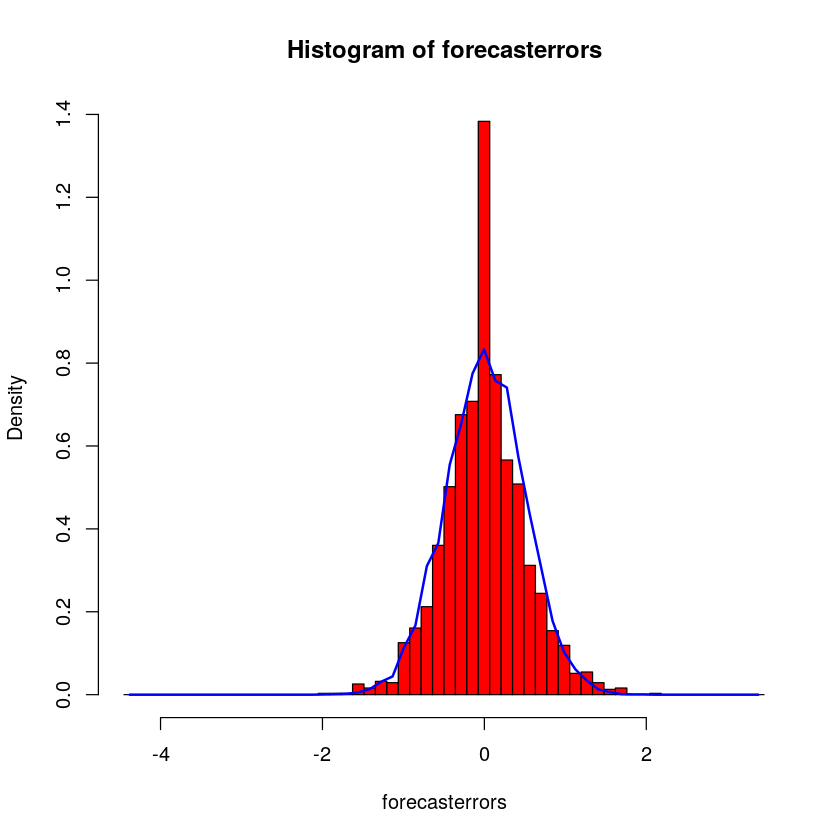

In [150]:
plot.ts(df1_2yr_HWforecast$residuals)            # make a time plot
plotForecastErrors(df1_2yr_HWforecast$residuals) 

### ARIMA models

These specify a correlation structure for the irregular component of the timeseries. They require the time series data to be non-stationary. This could be acheived with differencing. ARIMA models are specified with ARIMA(p,d,q). d is the level of differencing, and p and q can be found using the autocorrelation and partial correlation structure of the time series (acf and pacf).

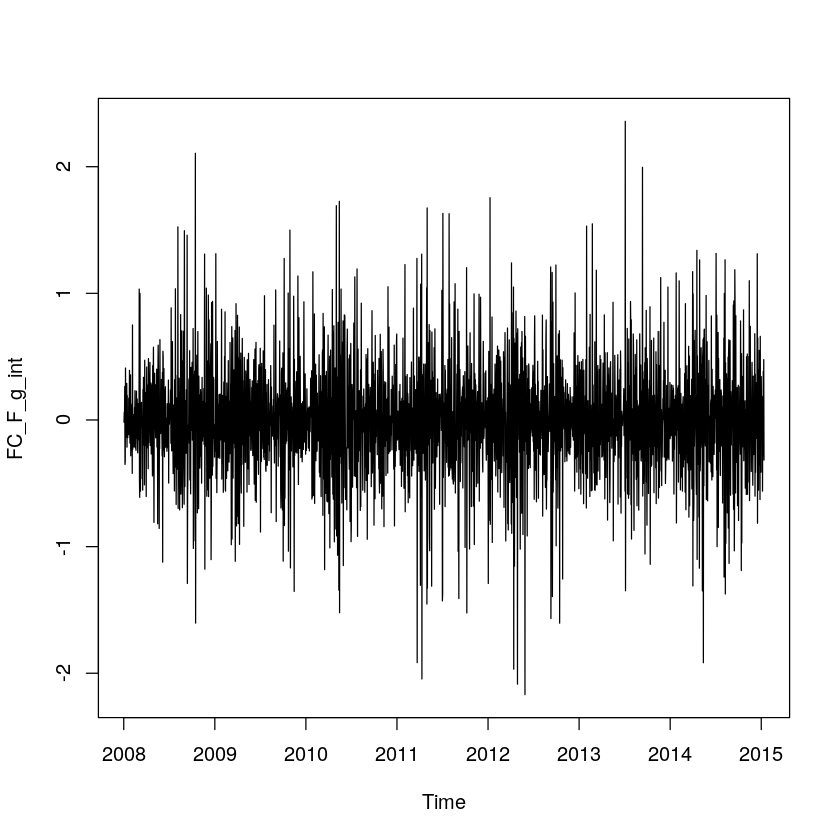

In [151]:
# First difference the timeseries
df1_diff1 <- diff(df1_ts, differences=1)
plot.ts(df1_diff1) # looks pretty stationary, but we could test with Augmented Dickey-Fuller
# Since we have differenced once, we will use ARIMA(p, 1, q)

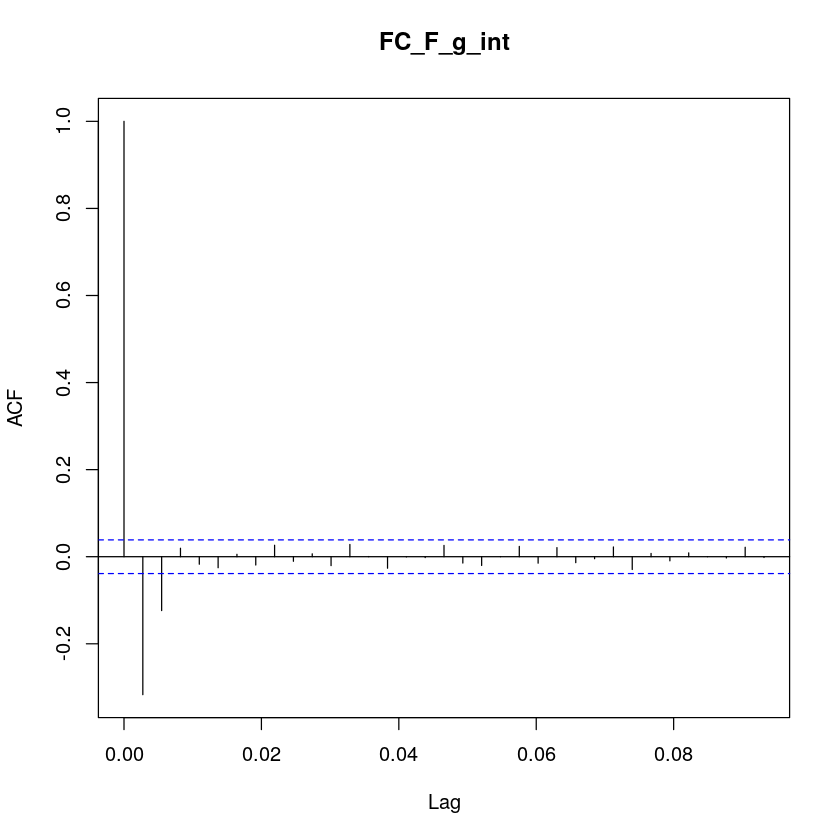

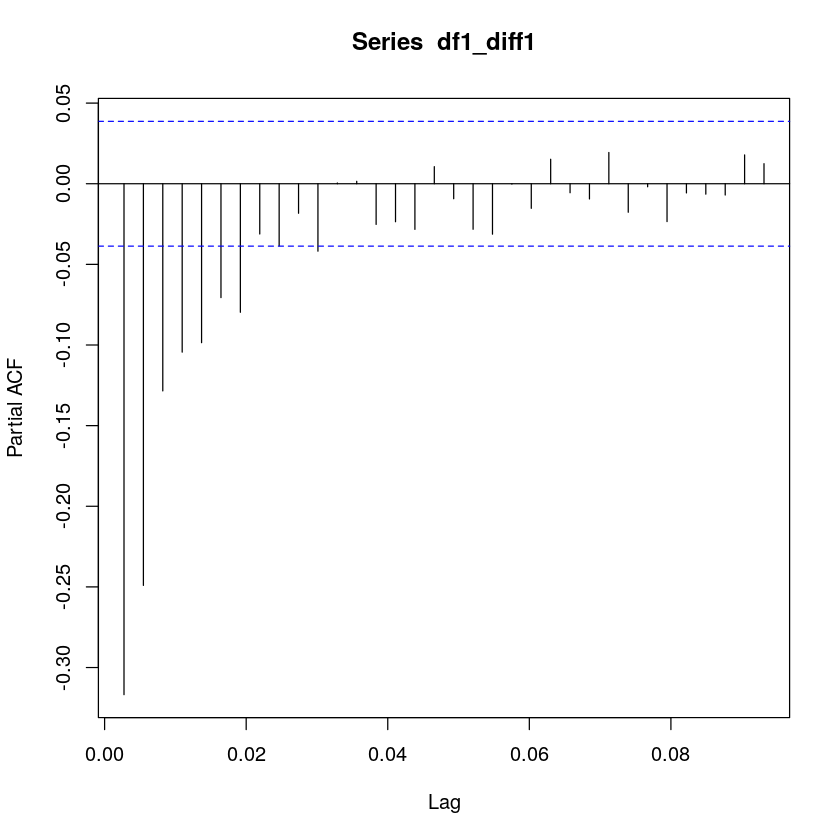

In [152]:
# Examine Acf of diffed data
acf(df1_diff1)             # plot a correlogram
#acf(df1_diff1, lag.max=2*365, plot=FALSE) # get the autocorrelation values
pacf(df1_diff1)  
# Looking at ACF shows that lags 1 and 2 exceed significance bounds, all others seem random/nonsignificant

The autocorrelation drops to zero after lag 2, and partial correlation drops to zero after lag 6. That gives a few candidate models.

* an ARMA(6,0) model - autoregressive model of order p=6, since the partial autocorrelogram is zero after lag 6, and the autocorrelogram tails off to zero (although perhaps too abruptly for this model to be appropriate)
* an ARMA(0,2) model, that is, a moving average model of order q=2, since the autocorrelogram is zero after lag 1 and the partial autocorrelogram tails off to zero
* an ARMA(p,q) model, that is, a mixed model with p and q greater than 0, since the autocorrelogram and partial correlogram tail off to zero (although the correlogram probably tails off to zero too abruptly for this model to be appropriate)


In [153]:
# Auto arima can also be used to autoselect a model.
# This didn't choose any of the models above, perhaps because
# there is seasonality and a trend? Not sure
auto.arima(df1_ts, ic='bic')

Series: df1_ts 
ARIMA(1,1,1)                    

Coefficients:
         ar1      ma1
      0.3106  -0.7822
s.e.  0.0315   0.0213

sigma^2 estimated as 0.1639:  log likelihood=-1320.72
AIC=2647.45   AICc=2647.46   BIC=2665


Call:
arima(x = df1_ts, order = c(1, 1, 1))

Coefficients:
         ar1      ma1
      0.3106  -0.7822
s.e.  0.0315   0.0213

sigma^2 estimated as 0.1639:  log likelihood = -1320.72,  aic = 2647.45

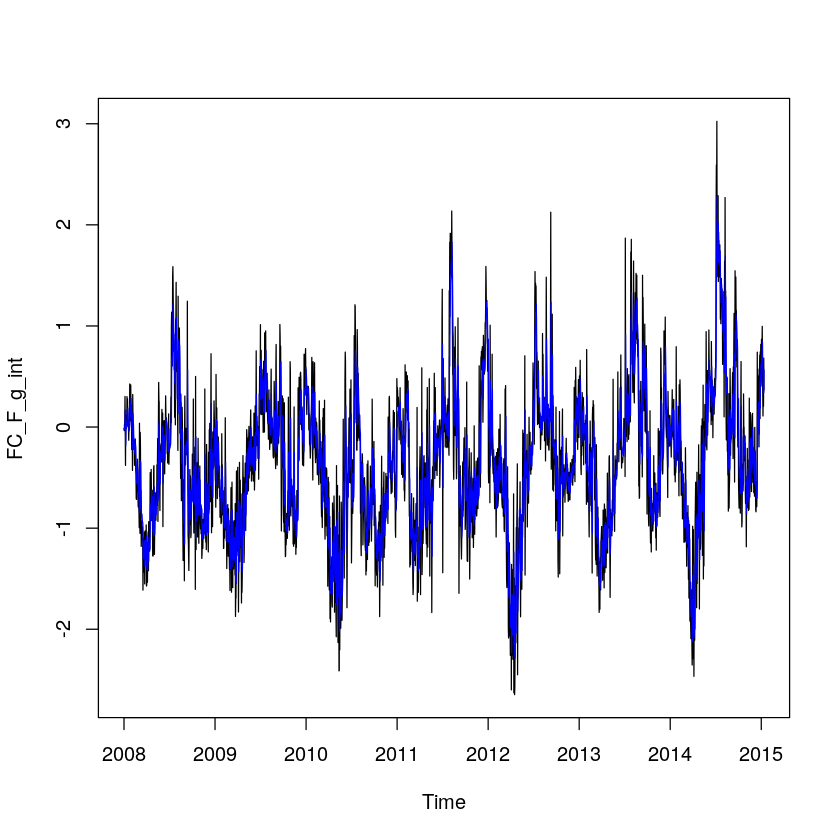

In [154]:
# Now the forecast
#df1_ds <- ts(df1$FC_F_g_int, frequency=7)
df1_arima <- arima(df1_ts, order=c(1,1,1)) # fit an ARIMA(1,1,1) model
#seasonal_df1<-arima(df1_ts,order=c(0,0,0),seasonal=list(order=c(0,1,0),period=365))
df1_arima
plot(df1_ts)
lines(fitted(df1_arima), col='blue')

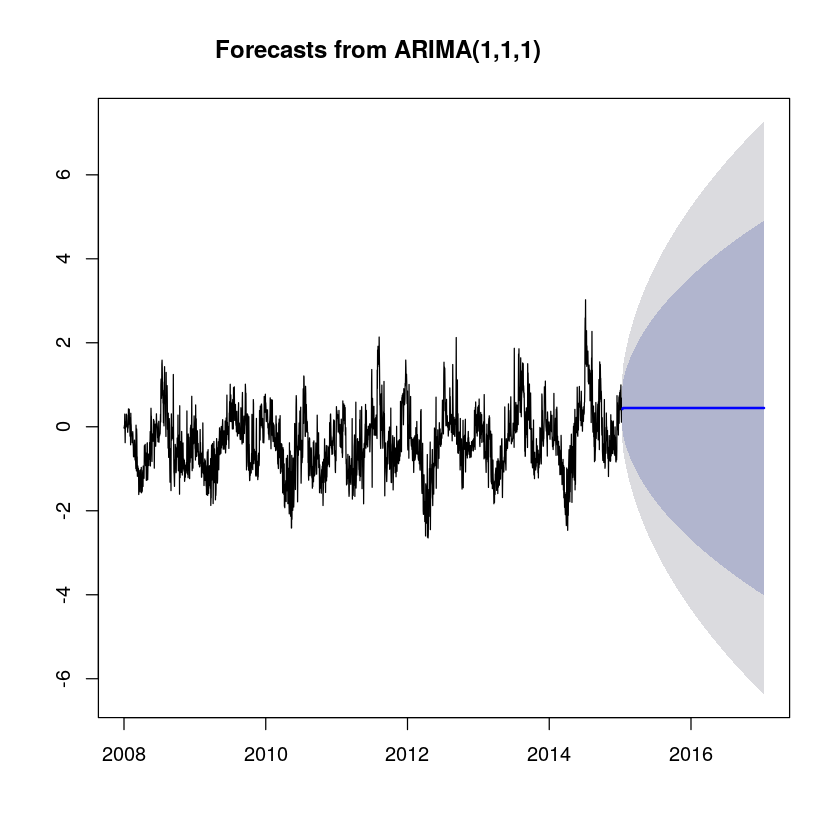

In [155]:
df1_arima_forecast <- forecast.Arima(df1_arima)
plot.forecast(df1_arima_forecast)


	Box-Ljung test

data:  df1_arima_forecast$residuals
X-squared = 432.01, df = 365, p-value = 0.008966


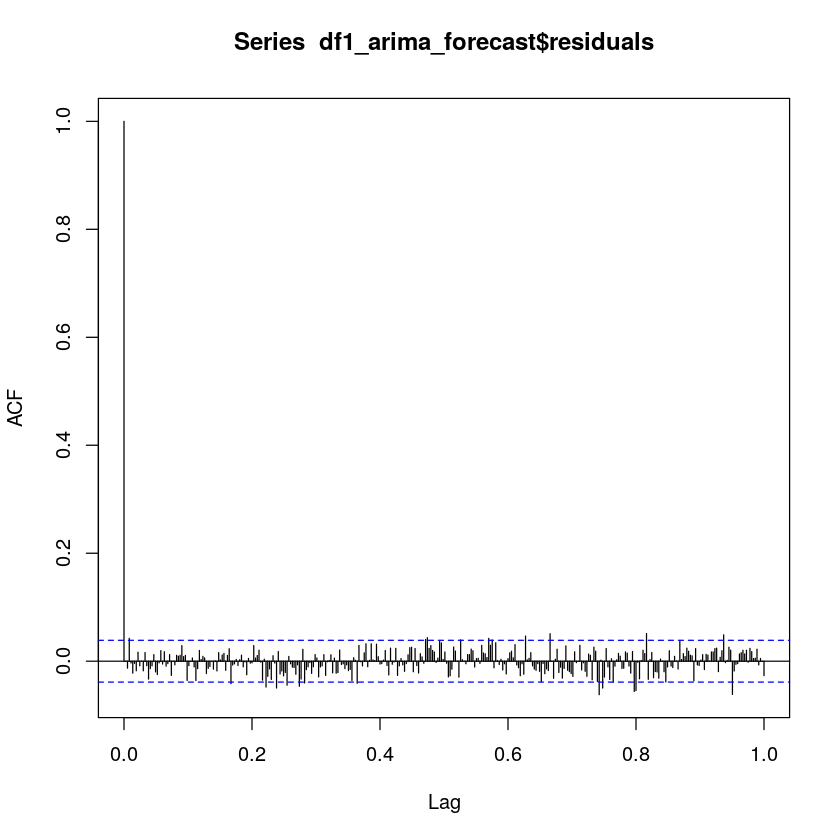

In [156]:
# Check the residuals of the model
acf(df1_arima_forecast$residuals, lag.max=365)
Box.test(df1_arima_forecast$residuals, lag=365, type="Ljung-Box")

### A couple other forecasting methods

from http://robjhyndman.com/hyndsight/dailydata/

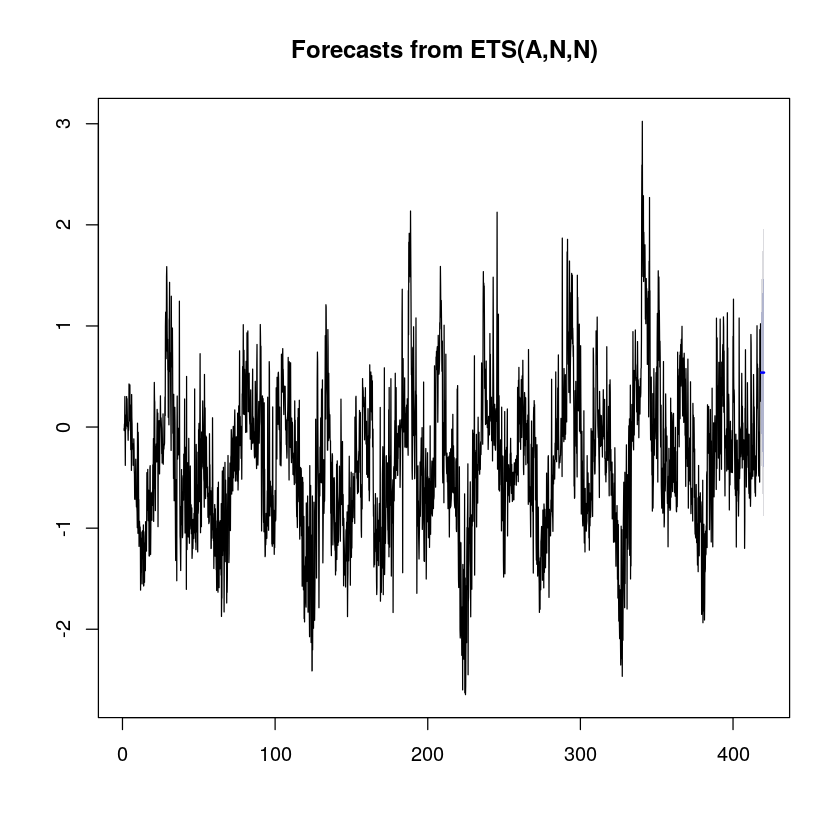

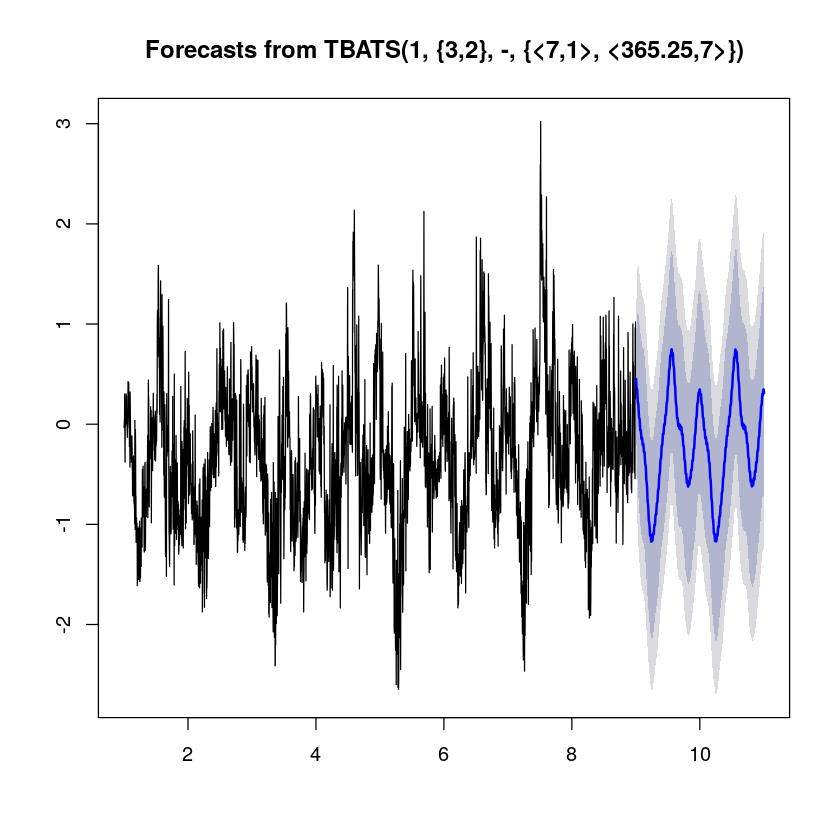

In [157]:
# For daily data it may be smart to use frequecy of 7
df2_ts <- ts(df1$FC_F_g_int, frequency = 7)

#Then any of the usual time series forecasting methods should produce reasonable forecasts. For example

fit <- ets(df2_ts)
fc <- forecast(fit)
plot(fc)

#When the time series is long enough to take in more than a year, then it may be necessary to allow for annual seasonality as well as weekly seasonality. In that case, a multiple seasonal model such as TBATS is required.

y <- msts(df1$FC_F_g_int, seasonal.periods=c(7,365.25))
fit <- tbats(y)
fc <- forecast(fit)
plot(fc)